<a href="https://colab.research.google.com/github/bassamadnan/yolo-model/blob/main/YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.0/721.0 kB 9.6 MB/s eta 0:00:00


In [9]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [19]:
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO

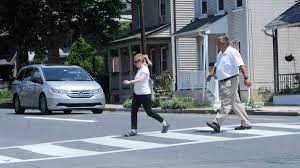

In [18]:
image = cv2.imread("/content/drive/MyDrive/yolov3.png")

cv2_imshow(image)


In [20]:
model = YOLO("yolov8n.pt")

100%|██████████| 6.23M/6.23M [00:00<00:00, 225MB/s]


In [22]:
results = model.predict(source=image, save=True, save_txt=True)  # save predictions as labels
results


0: 384x640 2 persons, 1 car, 161.4ms
Speed: 3.5ms preprocess, 161.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
0 label saved to runs/detect/predict/labels


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted p

In [26]:
# https://docs.ultralytics.com/tasks/detect/#train

In [ ]:
from ultralytics import YOLO

# Load a COCO-pretrained YOLOv8n model
model = YOLO('yolov8n.pt')

# Display model information (optional)
model.info()

# Train the model on the COCO8 example dataset for 100 epochs
results = model.train(data='coco8.yaml', epochs=100, imgsz=640)

# Run inference with the YOLOv8n model on the 'bus.jpg' image
results = model('path/to/bus.jpg')

In [24]:
results = model('https://ultralytics.com/images/bus.jpg')  # predict on an image

100%|██████████| 476k/476k [00:00<00:00, 52.1MB/s]


image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 431.9ms
Speed: 4.8ms preprocess, 431.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


In [25]:
results = model("/content/drive/MyDrive/yolov3.png")


image 1/1 /content/drive/MyDrive/yolov3.png: 384x640 2 persons, 1 car, 118.0ms
Speed: 2.4ms preprocess, 118.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


# Trying out with a few more images

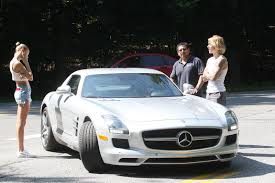

In [29]:
image = cv2.imread("/content/drive/MyDrive/humanvscar.png")

cv2_imshow(image)


In [30]:
results = model("/content/drive/MyDrive/humanvscar.png")


image 1/1 /content/drive/MyDrive/humanvscar.png: 448x640 3 persons, 2 cars, 327.2ms
Speed: 3.4ms preprocess, 327.2ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


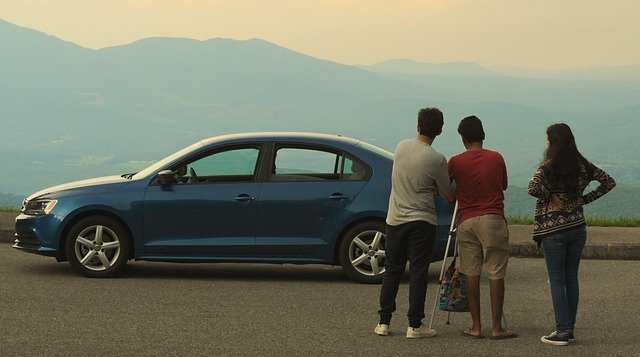

In [34]:
image = cv2.imread("/content/drive/MyDrive/carvshuman.jpg") # jpg file

cv2_imshow(image)

In [39]:
results = model("/content/drive/MyDrive/carvshuman.jpg")


image 1/1 /content/drive/MyDrive/carvshuman.jpg: 384x640 3 persons, 2 cars, 1 handbag, 237.3ms
Speed: 4.1ms preprocess, 237.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


In [45]:
results[0].save(filename='drive_save_result.jpg')  # save to disk

'drive_save_result.jpg'

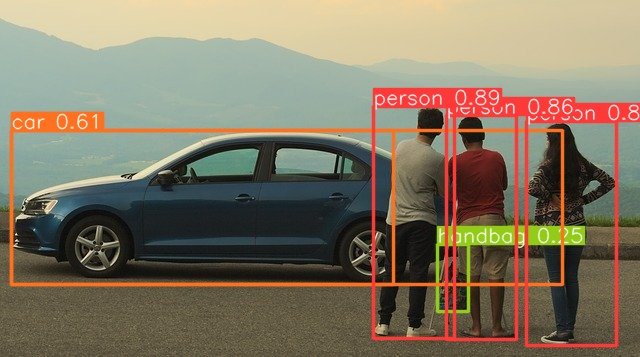

In [46]:
image = cv2.imread("/content/drive_save_result.jpg") # jpg file

cv2_imshow(image)

In [48]:
print(results[0].probs)

None


### Time test against a high resolution image (3000 x 1787)

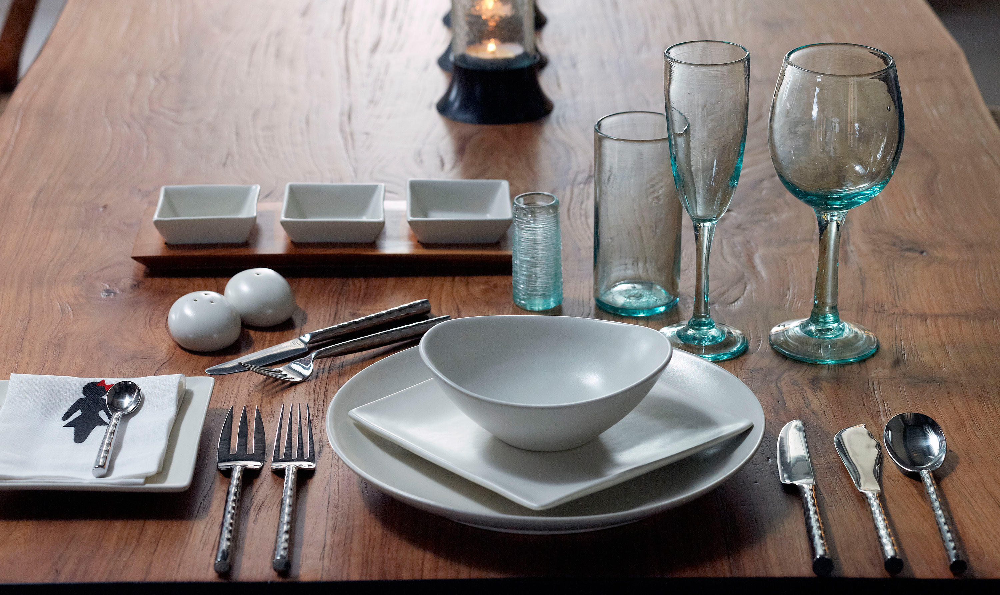

In [50]:
image = cv2.imread("art-de-la-table-2-01-pro-g-arcit18.jpg") # jpg file

cv2_imshow(image)

In [51]:
results = model("art-de-la-table-2-01-pro-g-arcit18.jpg")


image 1/1 /content/art-de-la-table-2-01-pro-g-arcit18.jpg: 384x640 2 wine glasss, 1 cup, 2 forks, 2 knifes, 2 spoons, 1 bowl, 1 dining table, 118.4ms
Speed: 5.2ms preprocess, 118.4ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


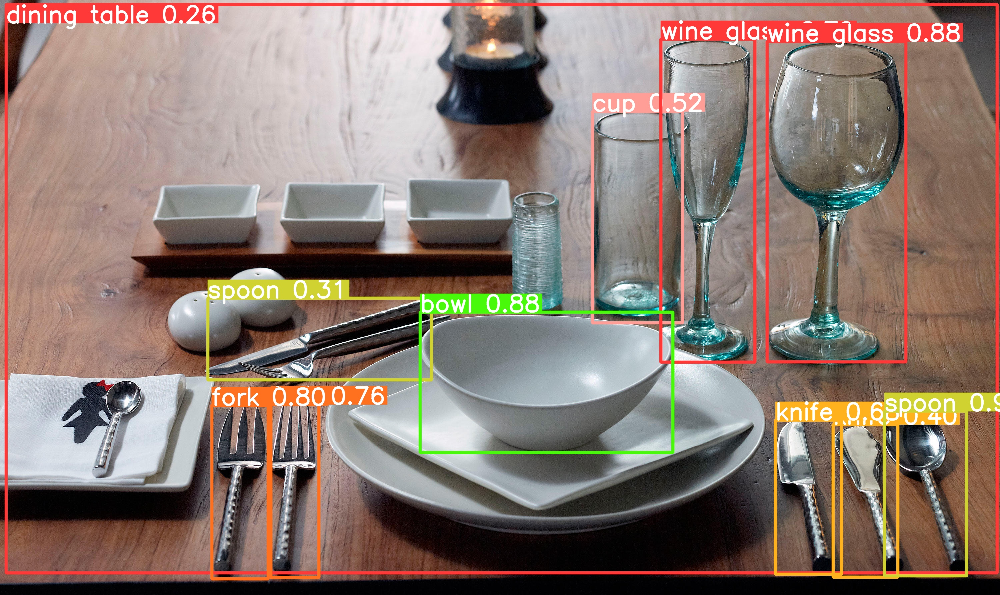

In [52]:
results[0].save(filename='drive_save_result.jpg')  # save to disk
image = cv2.imread("/content/drive_save_result.jpg") # jpg file

cv2_imshow(image)